# **WGAN**

In [2]:
import tensorflow as tf
from tensorflow.keras import layers
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import zipfile
import os
import time


In [4]:
zip_file_path = '/content/drive/MyDrive/Data/FaceExpressions (1).zip'
extraction_dir = 'dataset'

with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
    zip_ref.extractall(extraction_dir)

### **Load And Preprocess Data**

In [5]:
# Load and preprocess the data
base_dir = '/content/dataset/dataset'
data_path = '/content/dataset/data.csv'
data = pd.read_csv(data_path)

In [6]:
# Define image size and batch size
IMG_SIZE = 64
BATCH_SIZE = 64

def preprocess_image(img_path):
    img = tf.io.read_file(img_path)
    img = tf.image.decode_image(img, channels=3)
    img.set_shape([None, None, 3])  # Explicitly set the shape after decoding
    img = tf.image.resize(img, (IMG_SIZE, IMG_SIZE))
    img = (img - 127.5) / 127.5  # Normalize the images to [-1, 1]
    return img

def load_and_preprocess_from_path_label(path):
    full_img_path = tf.strings.join([base_dir, path], separator=os.sep)
    return preprocess_image(full_img_path)

# Create a TensorFlow Dataset from the DataFrame
paths = data['path'].values
dataset = tf.data.Dataset.from_tensor_slices(paths)
dataset = dataset.map(lambda x: load_and_preprocess_from_path_label(x), num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset = dataset.shuffle(buffer_size=1000).batch(BATCH_SIZE).prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

### **WGAN Generator**

In [7]:
# Define the Generator model
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    assert model.output_shape == (None, 8, 8, 256)

    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 16, 16, 128)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    assert model.output_shape == (None, 32, 32, 64)
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    assert model.output_shape == (None, 64, 64, 3)

    return model

### **WGAN Generator**

In [8]:
# Define the Critic model
def build_critic():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[64, 64, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1))

    return model

### **Loss Functions**

In [9]:
# Wasserstein loss functions
def critic_loss(real_output, fake_output):
    return tf.reduce_mean(fake_output) - tf.reduce_mean(real_output)

def generator_loss(fake_output):
    return -tf.reduce_mean(fake_output)

generator = build_generator()
critic = build_critic()

generator_optimizer = tf.keras.optimizers.RMSprop(learning_rate=5e-5)
critic_optimizer = tf.keras.optimizers.RMSprop(learning_rate=5e-5)


### **Train Functions**

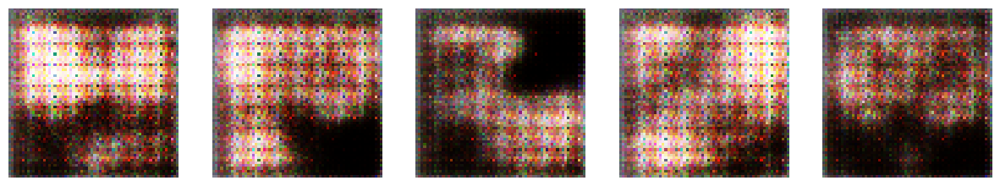

Epoch 1, Generator Loss: -13.1798, Critic Loss: -18.5963
Time for epoch 1 is 75.35824489593506 sec


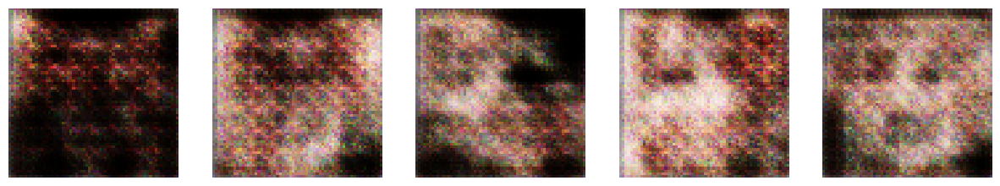

Epoch 2, Generator Loss: -0.9017, Critic Loss: -3.0500
Time for epoch 2 is 55.11040735244751 sec


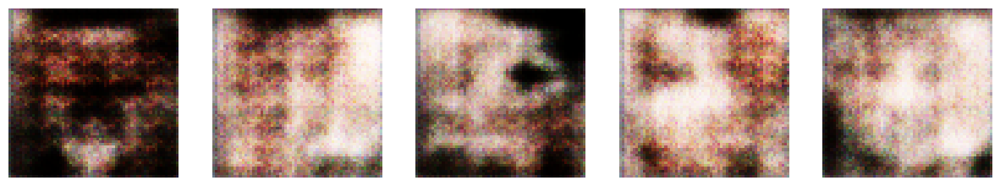

Epoch 3, Generator Loss: -0.9653, Critic Loss: -2.2889
Time for epoch 3 is 54.13676595687866 sec


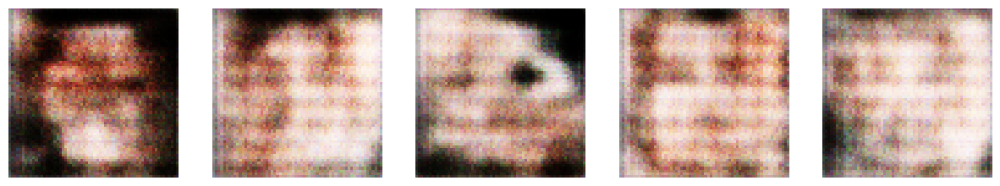

Epoch 4, Generator Loss: -0.1038, Critic Loss: -2.4496
Time for epoch 4 is 54.17576193809509 sec


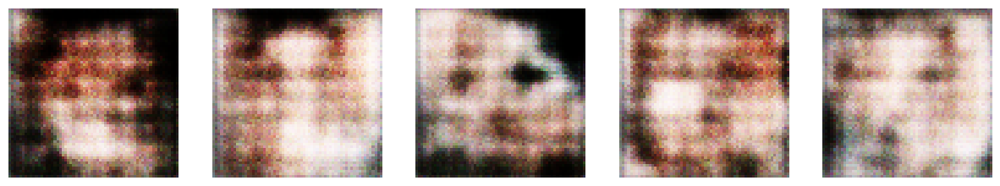

Epoch 5, Generator Loss: -0.3270, Critic Loss: -2.2127
Time for epoch 5 is 54.70741033554077 sec


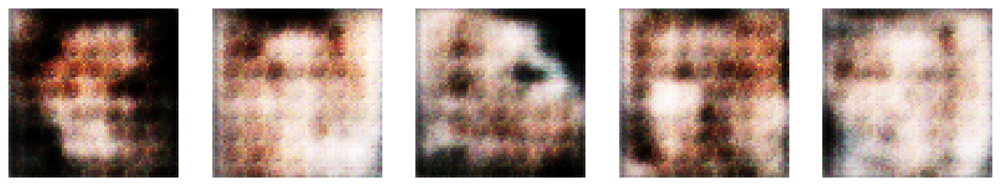

Epoch 6, Generator Loss: -0.7940, Critic Loss: -2.1903
Time for epoch 6 is 56.669862508773804 sec


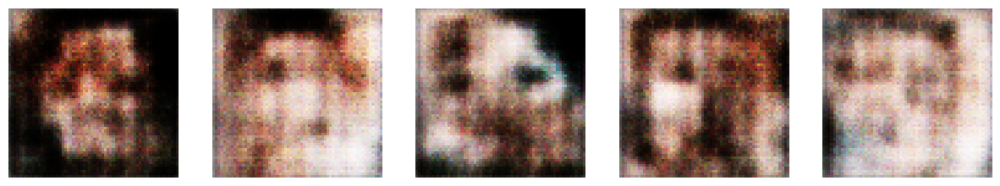

Epoch 7, Generator Loss: -0.0675, Critic Loss: -2.4982
Time for epoch 7 is 57.842918395996094 sec


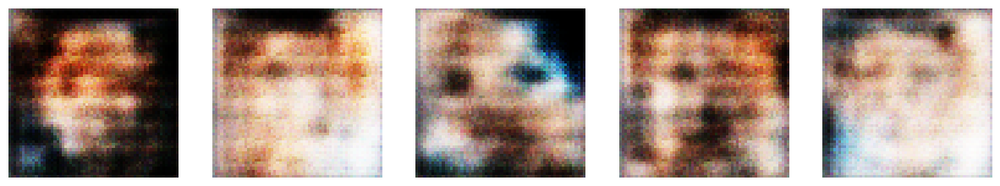

Epoch 8, Generator Loss: -0.2641, Critic Loss: -2.2320
Time for epoch 8 is 57.09319257736206 sec


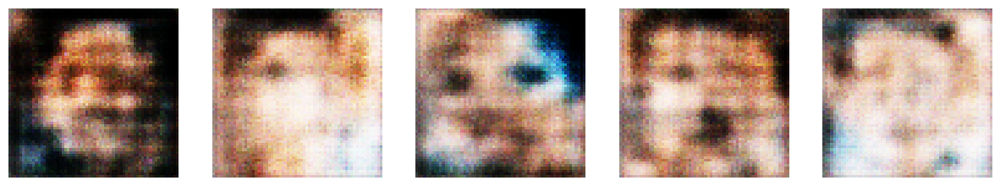

Epoch 9, Generator Loss: -1.0272, Critic Loss: -2.2435
Time for epoch 9 is 55.77023363113403 sec


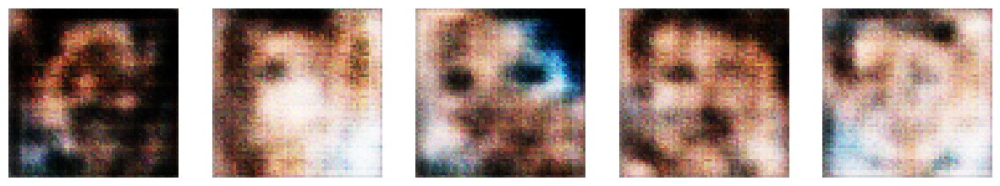

Epoch 10, Generator Loss: -1.3301, Critic Loss: -2.1078
Time for epoch 10 is 54.738483905792236 sec


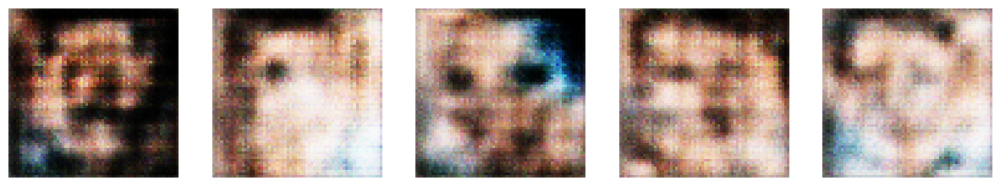

Epoch 11, Generator Loss: -0.7230, Critic Loss: -1.9864
Time for epoch 11 is 55.2261426448822 sec


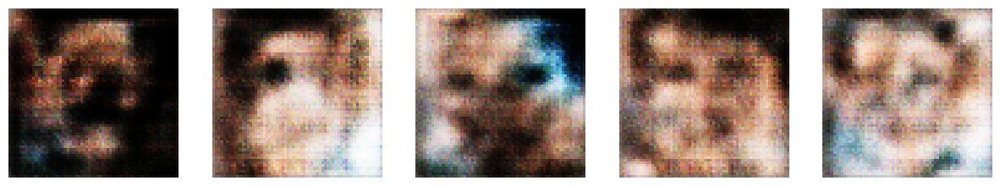

Epoch 12, Generator Loss: -1.0616, Critic Loss: -1.9745
Time for epoch 12 is 55.07097887992859 sec


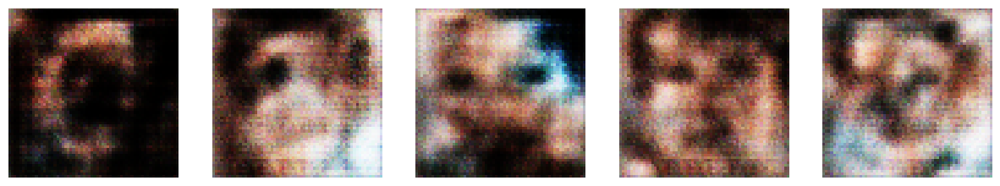

Epoch 13, Generator Loss: -0.8249, Critic Loss: -1.9838
Time for epoch 13 is 55.99657940864563 sec


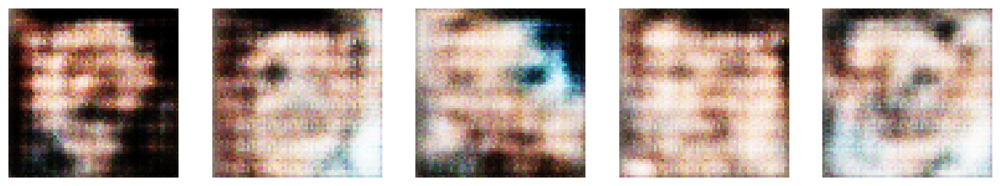

Epoch 14, Generator Loss: 0.2884, Critic Loss: -1.9354
Time for epoch 14 is 55.99711871147156 sec


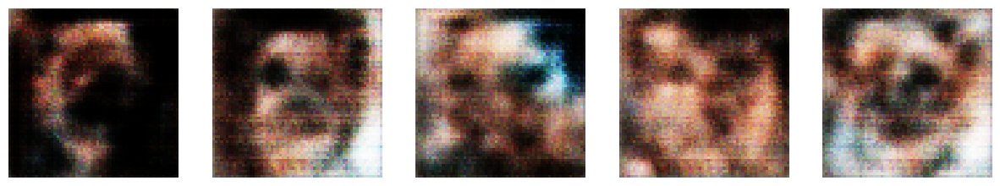

Epoch 15, Generator Loss: -0.9465, Critic Loss: -1.9893
Time for epoch 15 is 55.76161575317383 sec


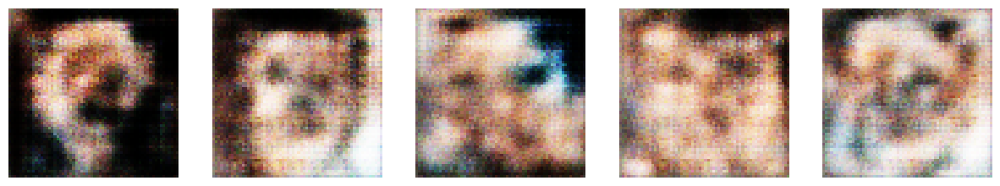

Epoch 16, Generator Loss: 0.7807, Critic Loss: -2.1898
Time for epoch 16 is 56.046546459198 sec


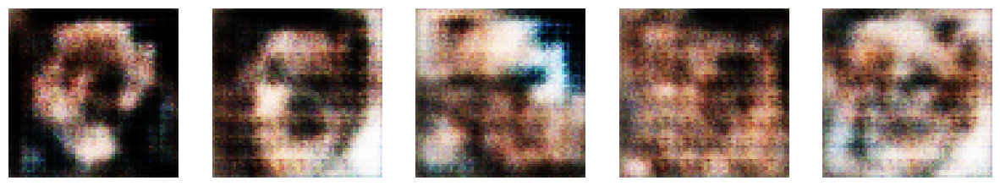

Epoch 17, Generator Loss: -0.5157, Critic Loss: -1.8471
Time for epoch 17 is 55.93928933143616 sec


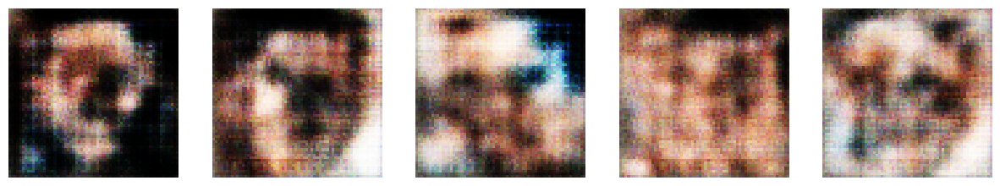

Epoch 18, Generator Loss: -0.6412, Critic Loss: -1.7922
Time for epoch 18 is 55.96578598022461 sec


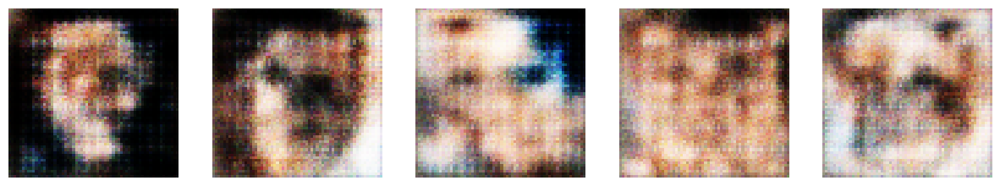

Epoch 19, Generator Loss: 0.2454, Critic Loss: -1.7585
Time for epoch 19 is 55.950422048568726 sec


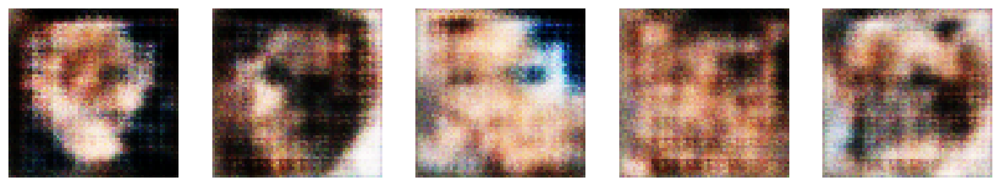

Epoch 20, Generator Loss: -0.3832, Critic Loss: -1.7387
Time for epoch 20 is 56.2076301574707 sec


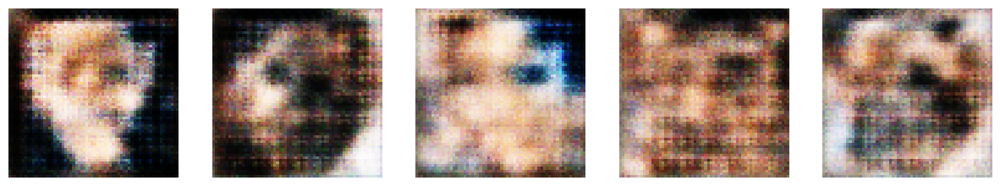

Epoch 21, Generator Loss: 0.0493, Critic Loss: -1.7563
Time for epoch 21 is 55.86398649215698 sec


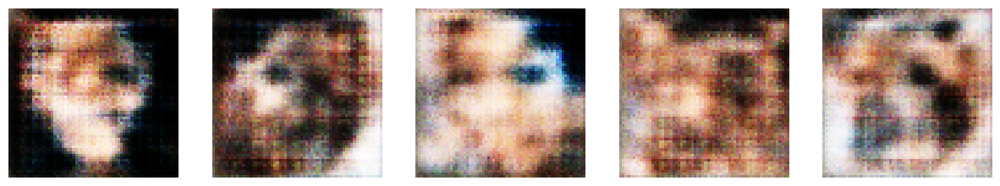

Epoch 22, Generator Loss: 0.6644, Critic Loss: -1.8368
Time for epoch 22 is 56.50489544868469 sec


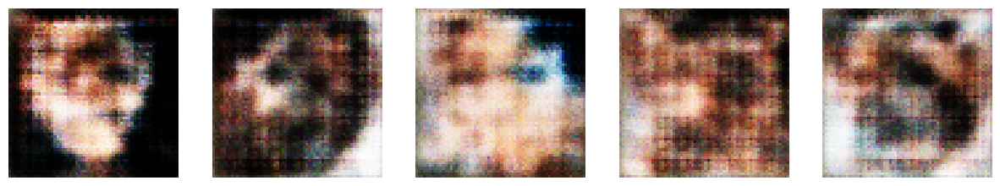

Epoch 23, Generator Loss: -0.7024, Critic Loss: -1.7431
Time for epoch 23 is 55.87524127960205 sec


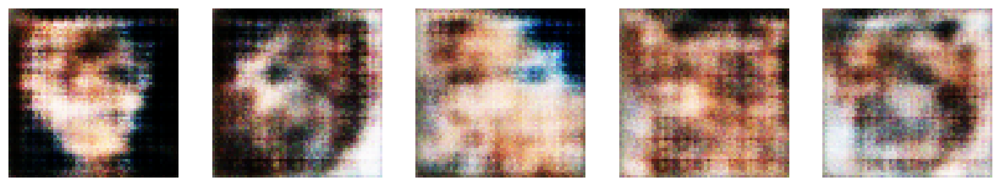

Epoch 24, Generator Loss: 0.0602, Critic Loss: -1.7588
Time for epoch 24 is 54.498329162597656 sec


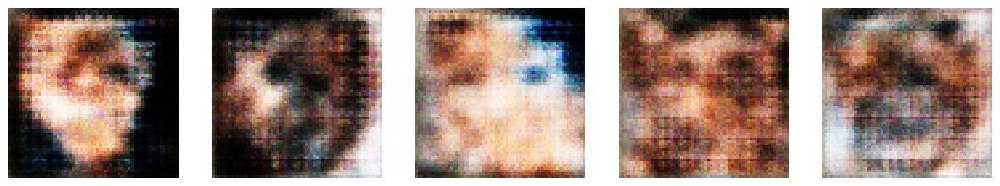

Epoch 25, Generator Loss: -1.1705, Critic Loss: -1.5978
Time for epoch 25 is 54.67005491256714 sec


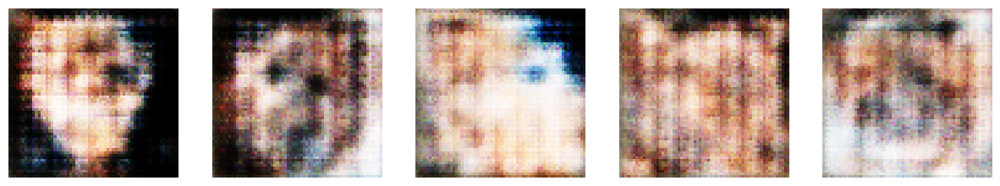

Epoch 26, Generator Loss: 0.6389, Critic Loss: -1.9570
Time for epoch 26 is 54.22442579269409 sec


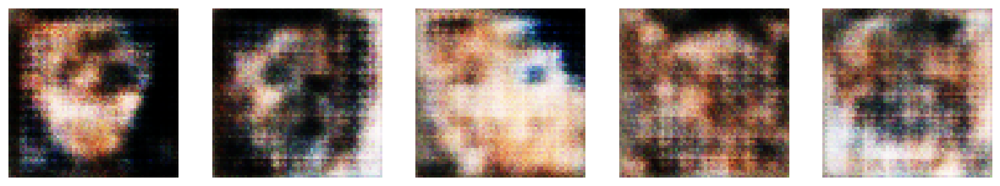

Epoch 27, Generator Loss: 0.6068, Critic Loss: -2.1926
Time for epoch 27 is 54.569071769714355 sec


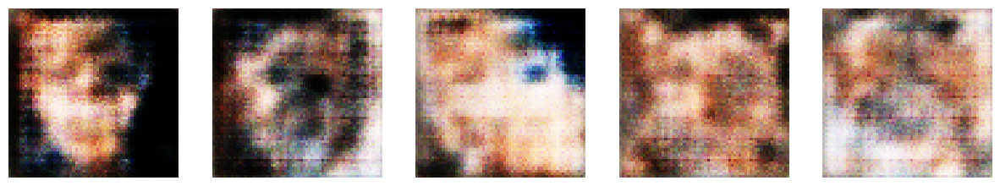

Epoch 28, Generator Loss: 0.9952, Critic Loss: -1.7386
Time for epoch 28 is 53.988404989242554 sec


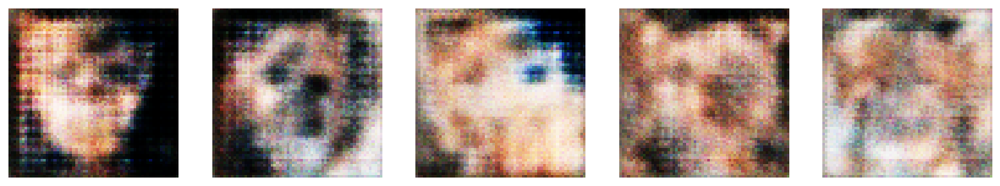

Epoch 29, Generator Loss: 0.2106, Critic Loss: -1.9749
Time for epoch 29 is 54.32802367210388 sec


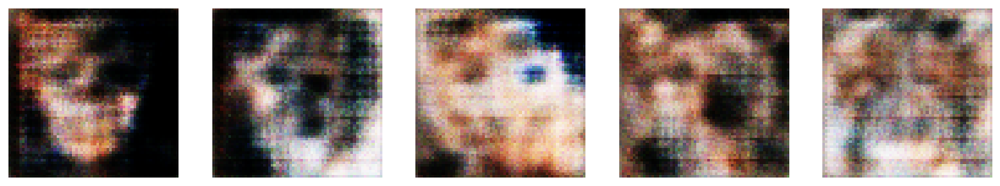

Epoch 30, Generator Loss: 0.0717, Critic Loss: -2.0512
Time for epoch 30 is 54.65801405906677 sec


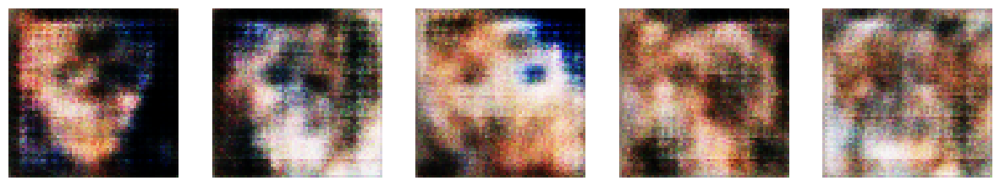

Epoch 31, Generator Loss: 0.0683, Critic Loss: -1.8307
Time for epoch 31 is 54.80352807044983 sec


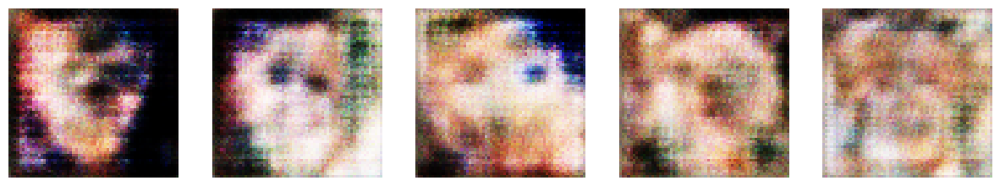

Epoch 32, Generator Loss: 1.0743, Critic Loss: -1.9716
Time for epoch 32 is 54.79783248901367 sec


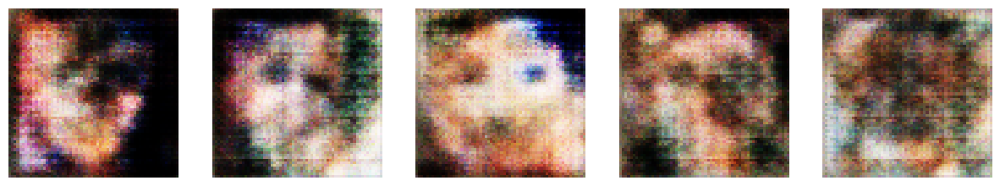

Epoch 33, Generator Loss: -0.3922, Critic Loss: -1.4964
Time for epoch 33 is 54.6877064704895 sec


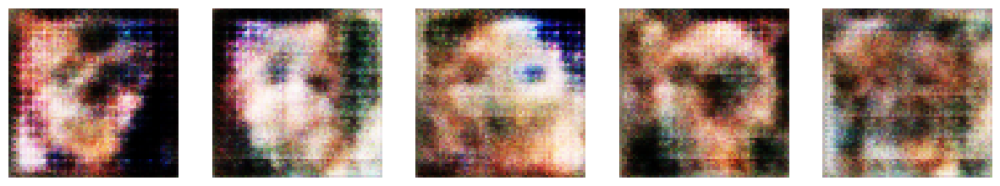

Epoch 34, Generator Loss: 0.9763, Critic Loss: -2.0672
Time for epoch 34 is 54.72187256813049 sec


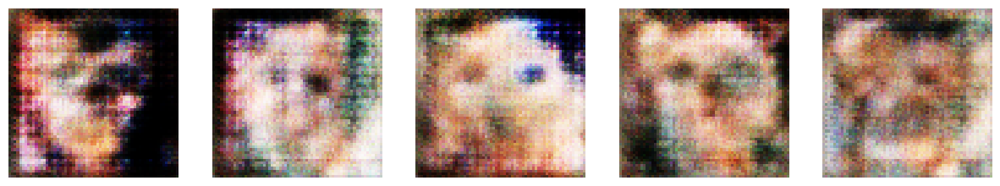

Epoch 35, Generator Loss: 0.9025, Critic Loss: -1.7655
Time for epoch 35 is 54.90954899787903 sec


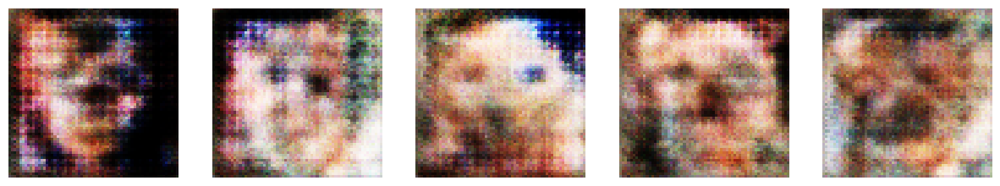

Epoch 36, Generator Loss: -0.0897, Critic Loss: -1.6447
Time for epoch 36 is 54.97050476074219 sec


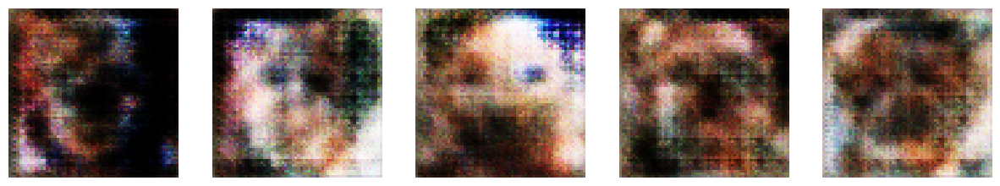

Epoch 37, Generator Loss: 0.1624, Critic Loss: -1.6337
Time for epoch 37 is 55.00285482406616 sec


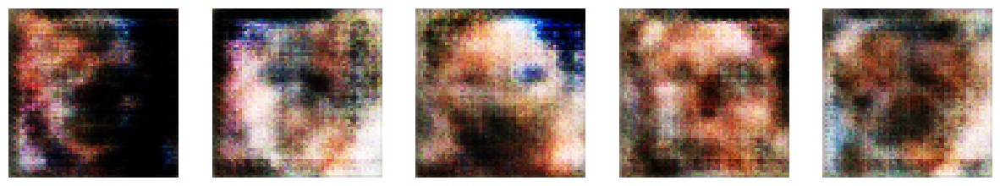

Epoch 38, Generator Loss: 0.3249, Critic Loss: -1.8153
Time for epoch 38 is 54.7687828540802 sec


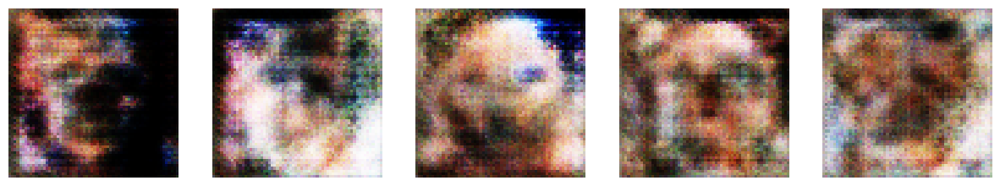

Epoch 39, Generator Loss: 1.0703, Critic Loss: -2.0279
Time for epoch 39 is 54.90691590309143 sec


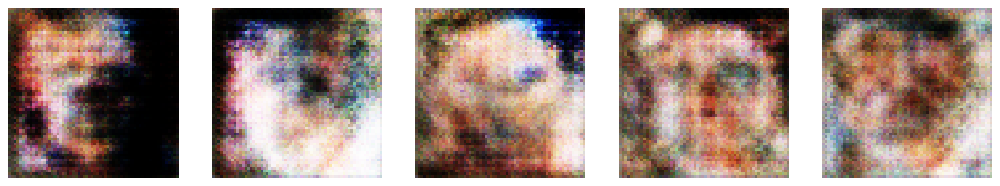

Epoch 40, Generator Loss: -0.0347, Critic Loss: -1.7219
Time for epoch 40 is 54.804871797561646 sec


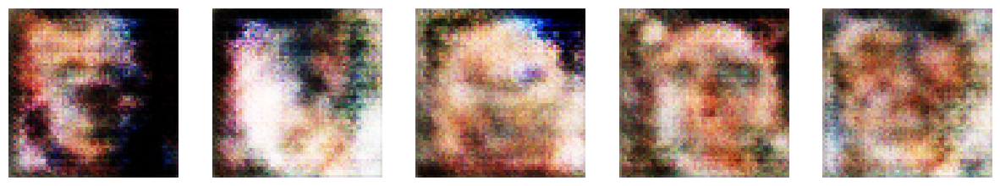

Epoch 41, Generator Loss: 0.3678, Critic Loss: -1.6430
Time for epoch 41 is 54.338740825653076 sec


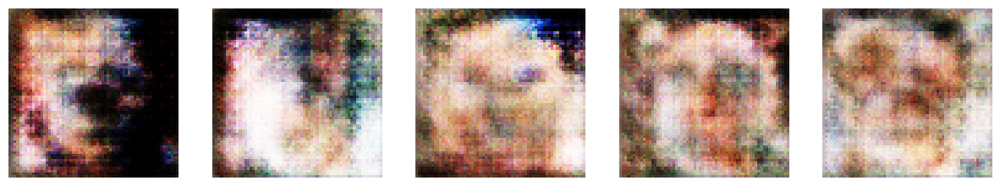

Epoch 42, Generator Loss: 0.2257, Critic Loss: -1.8893
Time for epoch 42 is 54.83500027656555 sec


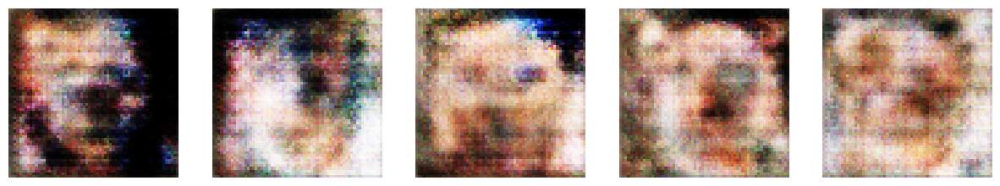

Epoch 43, Generator Loss: -0.8115, Critic Loss: -1.6680
Time for epoch 43 is 54.49080181121826 sec


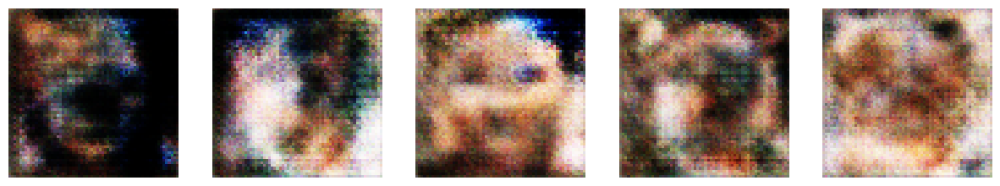

Epoch 44, Generator Loss: -0.9912, Critic Loss: -1.7693
Time for epoch 44 is 54.38947415351868 sec


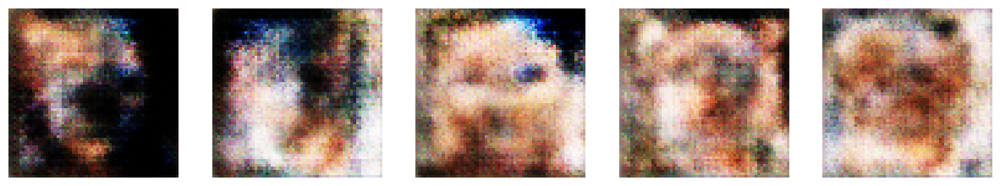

Epoch 45, Generator Loss: -0.4504, Critic Loss: -1.6775
Time for epoch 45 is 54.292675495147705 sec


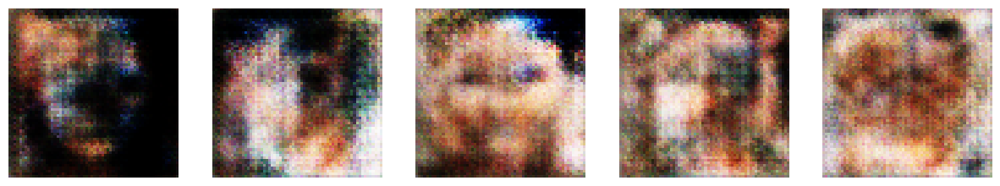

Epoch 46, Generator Loss: -0.2878, Critic Loss: -1.7521
Time for epoch 46 is 54.43794918060303 sec


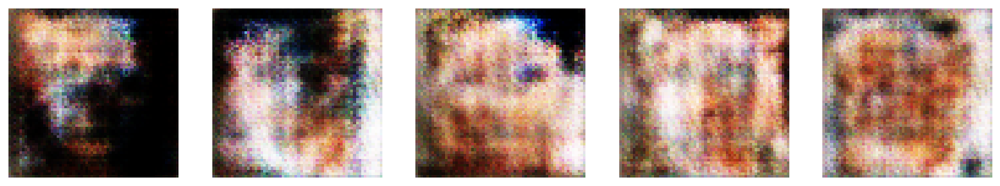

Epoch 47, Generator Loss: -1.2156, Critic Loss: -1.4218
Time for epoch 47 is 54.691789627075195 sec


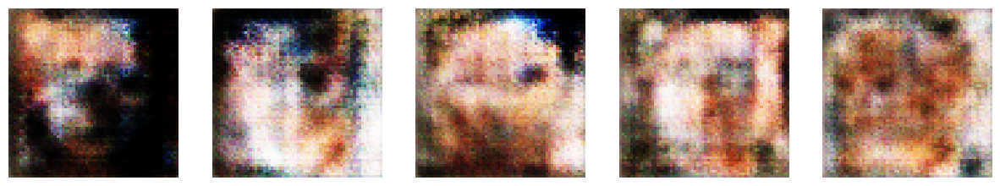

Epoch 48, Generator Loss: -1.3394, Critic Loss: -1.3864
Time for epoch 48 is 54.74931979179382 sec


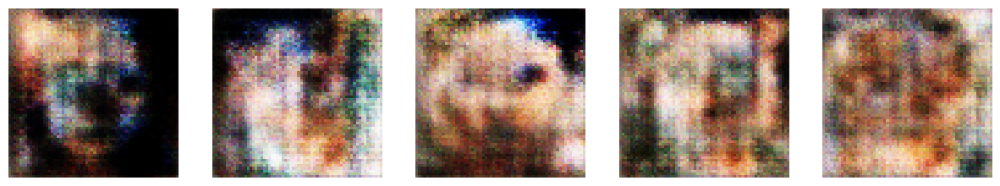

Epoch 49, Generator Loss: 0.3654, Critic Loss: -1.6030
Time for epoch 49 is 55.123653173446655 sec


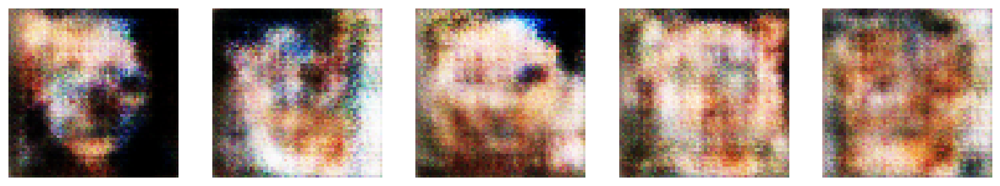

Epoch 50, Generator Loss: -0.9850, Critic Loss: -1.3671
Time for epoch 50 is 55.01456165313721 sec


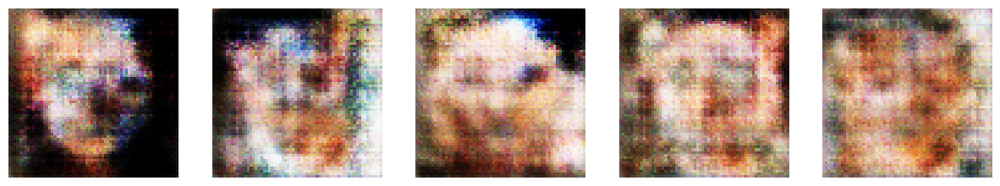

Epoch 51, Generator Loss: -0.7488, Critic Loss: -1.3701
Time for epoch 51 is 54.7542085647583 sec


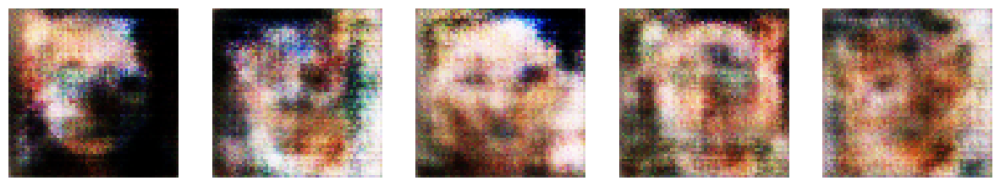

Epoch 52, Generator Loss: -1.0587, Critic Loss: -1.2852
Time for epoch 52 is 54.83649134635925 sec


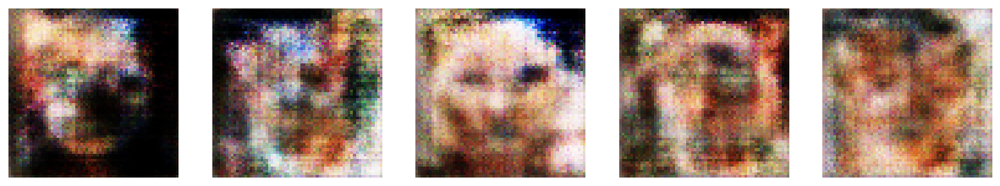

Epoch 53, Generator Loss: -1.3068, Critic Loss: -1.4238
Time for epoch 53 is 55.14548659324646 sec


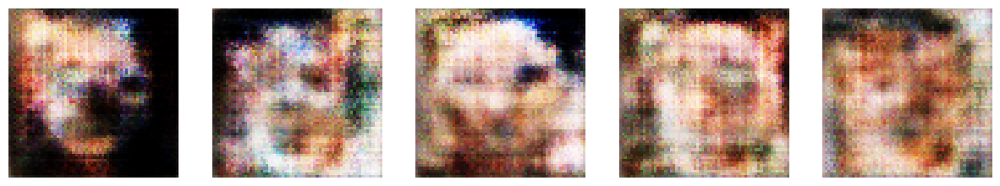

Epoch 54, Generator Loss: -1.2605, Critic Loss: -1.6007
Time for epoch 54 is 54.5494818687439 sec


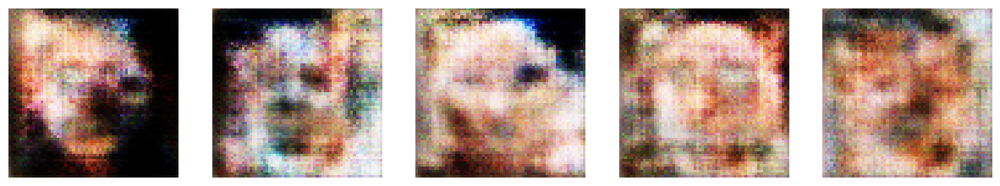

Epoch 55, Generator Loss: -1.0359, Critic Loss: -1.4330
Time for epoch 55 is 54.60513377189636 sec


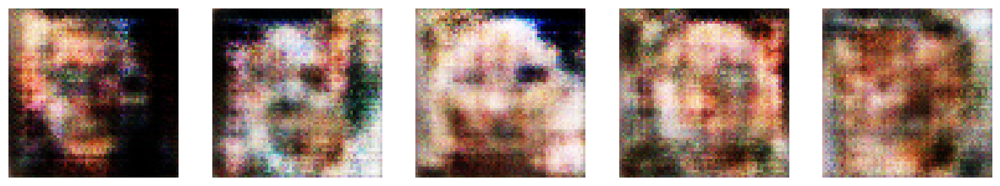

Epoch 56, Generator Loss: -2.0390, Critic Loss: -1.7657
Time for epoch 56 is 55.03593063354492 sec


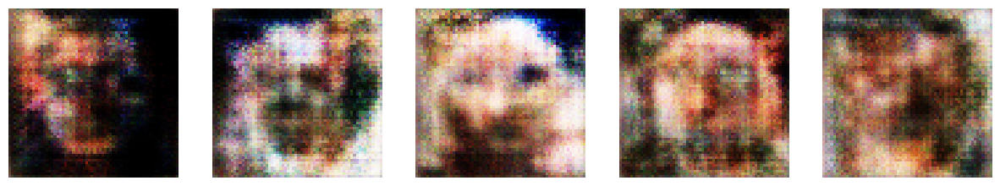

Epoch 57, Generator Loss: -1.6349, Critic Loss: -1.4980
Time for epoch 57 is 54.706217527389526 sec


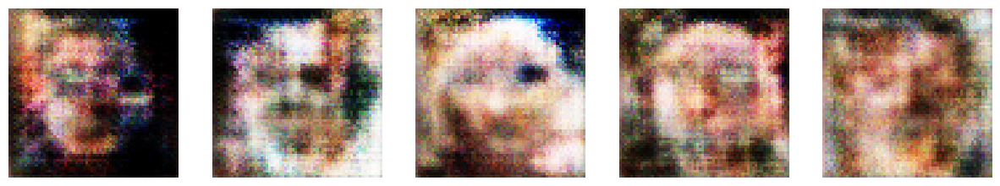

Epoch 58, Generator Loss: -1.1184, Critic Loss: -1.6169
Time for epoch 58 is 54.75780415534973 sec


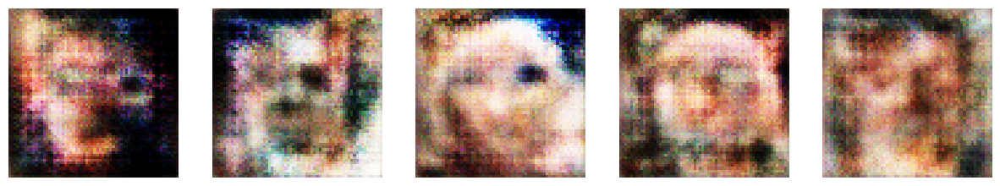

Epoch 59, Generator Loss: -2.1267, Critic Loss: -1.5156
Time for epoch 59 is 54.85507941246033 sec


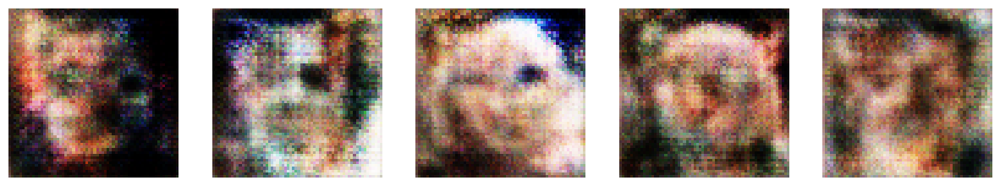

Epoch 60, Generator Loss: -1.1941, Critic Loss: -1.3291
Time for epoch 60 is 55.0551700592041 sec


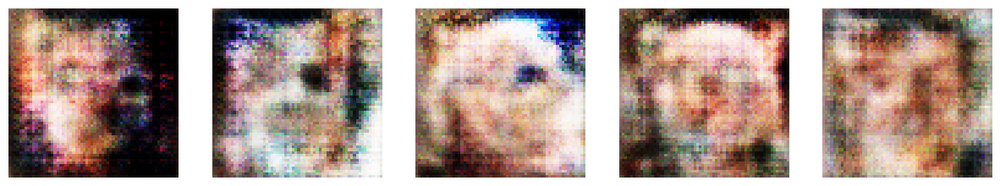

Epoch 61, Generator Loss: -1.1330, Critic Loss: -1.3530
Time for epoch 61 is 54.86658501625061 sec


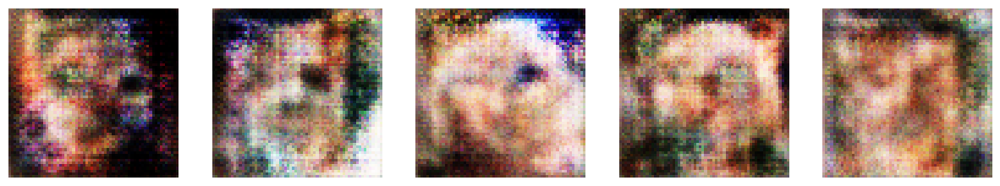

Epoch 62, Generator Loss: -0.1059, Critic Loss: -1.9714
Time for epoch 62 is 55.198429346084595 sec


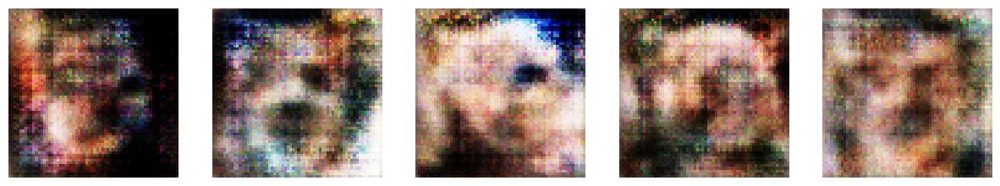

Epoch 63, Generator Loss: -0.4911, Critic Loss: -1.3946
Time for epoch 63 is 55.32706832885742 sec


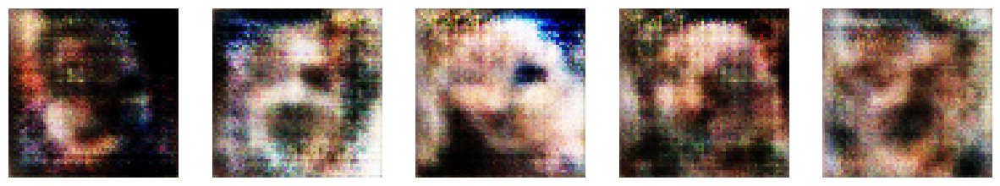

Epoch 64, Generator Loss: -1.0535, Critic Loss: -1.6275
Time for epoch 64 is 55.04732036590576 sec


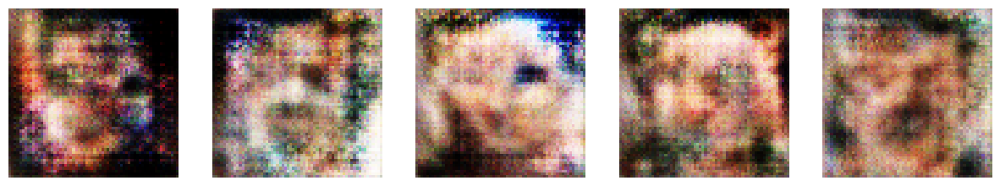

Epoch 65, Generator Loss: -0.7499, Critic Loss: -1.3599
Time for epoch 65 is 54.81029772758484 sec


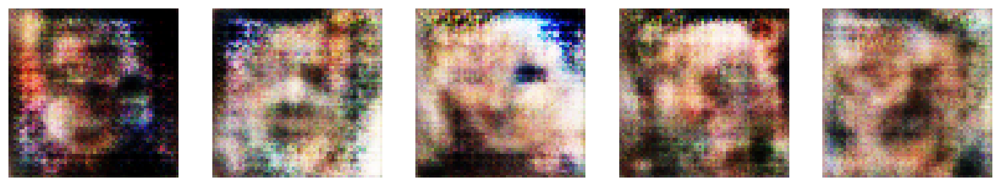

Epoch 66, Generator Loss: -1.4353, Critic Loss: -1.4056
Time for epoch 66 is 54.77206206321716 sec


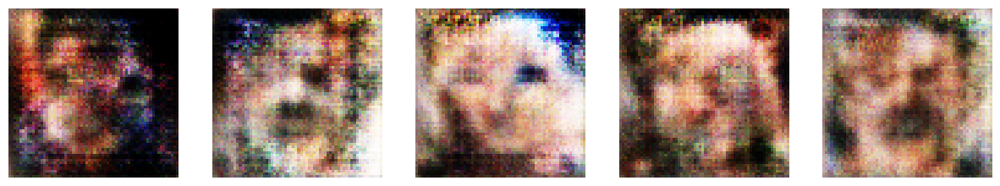

Epoch 67, Generator Loss: -1.9296, Critic Loss: -1.5592
Time for epoch 67 is 55.00685358047485 sec


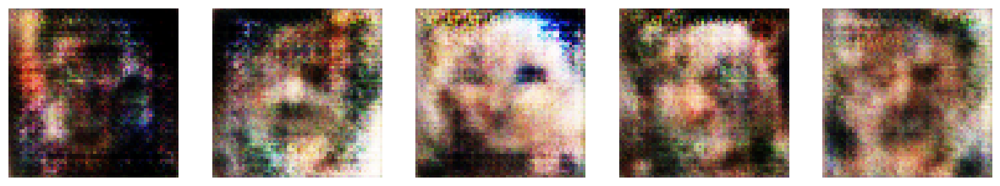

Epoch 68, Generator Loss: -1.4880, Critic Loss: -1.4177
Time for epoch 68 is 54.712281703948975 sec


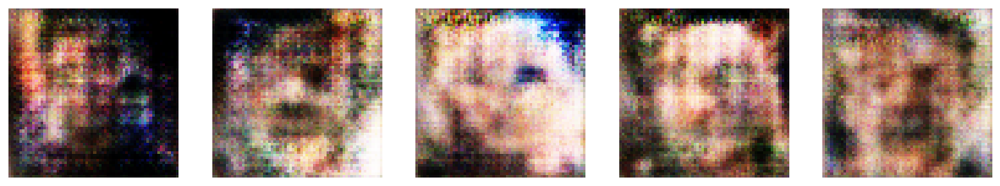

Epoch 69, Generator Loss: -1.8043, Critic Loss: -1.5901
Time for epoch 69 is 55.28803586959839 sec


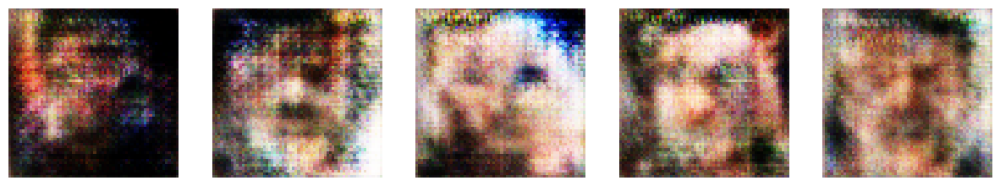

Epoch 70, Generator Loss: -0.9895, Critic Loss: -1.3465
Time for epoch 70 is 54.4406259059906 sec


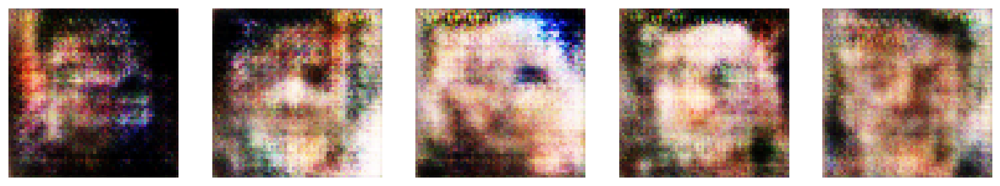

Epoch 71, Generator Loss: -1.3065, Critic Loss: -1.3722
Time for epoch 71 is 54.8070387840271 sec


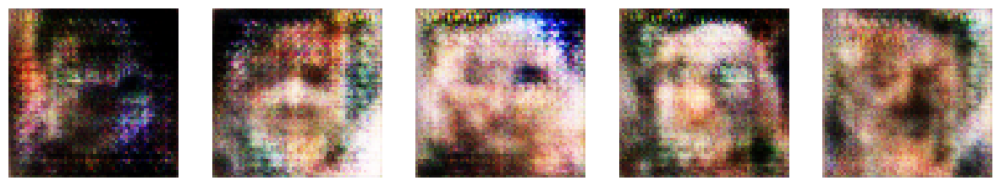

Epoch 72, Generator Loss: -0.7336, Critic Loss: -1.1646
Time for epoch 72 is 54.608508348464966 sec


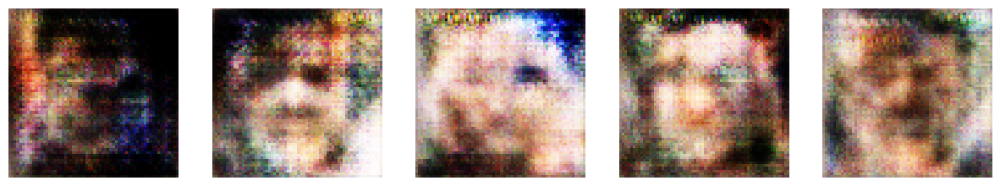

Epoch 73, Generator Loss: -1.8027, Critic Loss: -1.4771
Time for epoch 73 is 54.720024824142456 sec


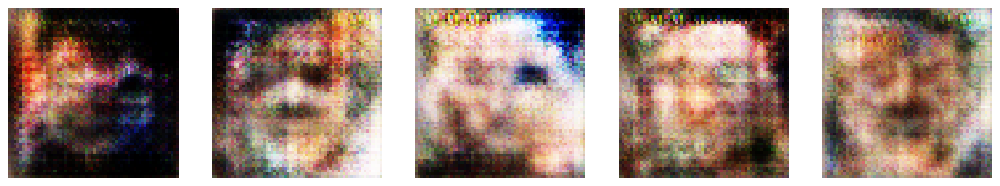

Epoch 74, Generator Loss: -0.5276, Critic Loss: -1.6494
Time for epoch 74 is 54.690253496170044 sec


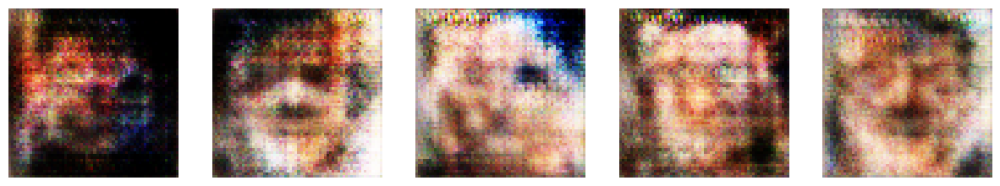

Epoch 75, Generator Loss: -0.2347, Critic Loss: -1.2902
Time for epoch 75 is 54.680354595184326 sec


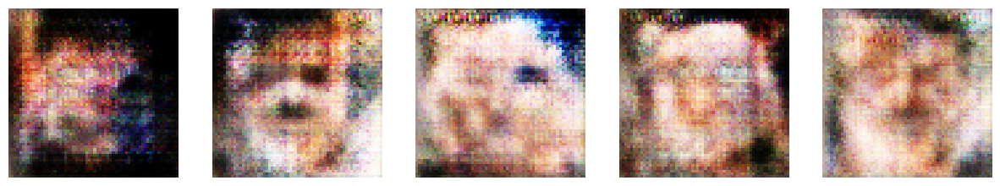

Epoch 76, Generator Loss: -1.0701, Critic Loss: -1.3387
Time for epoch 76 is 54.6953444480896 sec


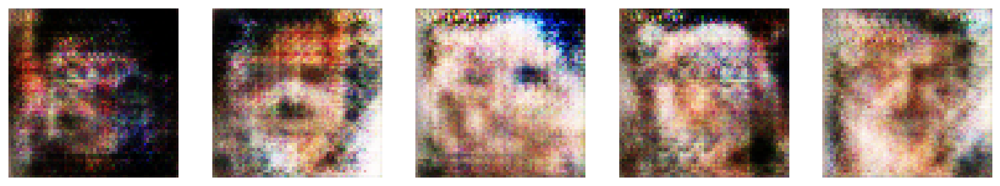

Epoch 77, Generator Loss: -0.0967, Critic Loss: -1.2457
Time for epoch 77 is 54.986191749572754 sec


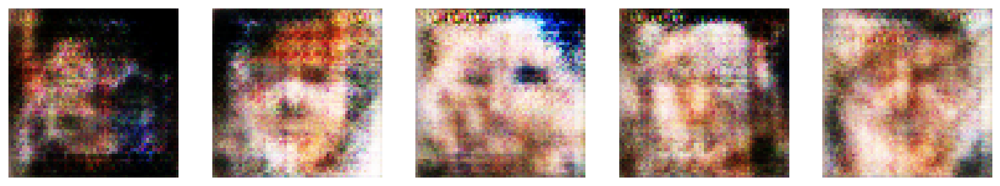

Epoch 78, Generator Loss: -0.6016, Critic Loss: -1.5630
Time for epoch 78 is 82.121985912323 sec


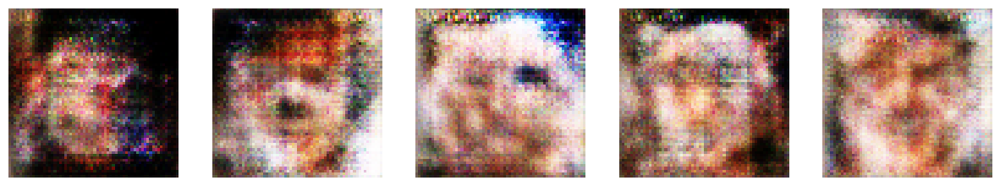

Epoch 79, Generator Loss: -0.7817, Critic Loss: -1.1036
Time for epoch 79 is 58.44169044494629 sec


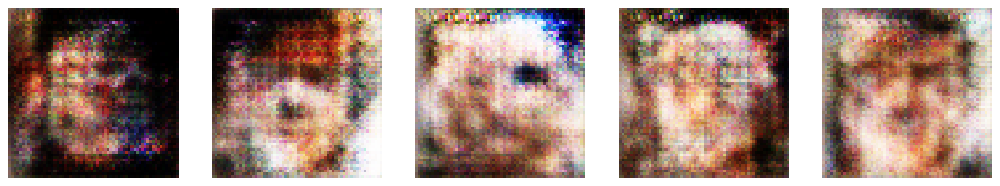

Epoch 80, Generator Loss: -0.4744, Critic Loss: -0.9999
Time for epoch 80 is 57.78708529472351 sec


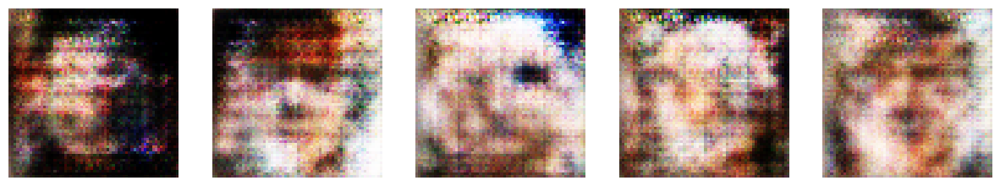

Epoch 81, Generator Loss: 0.3095, Critic Loss: -1.1048
Time for epoch 81 is 58.50685477256775 sec


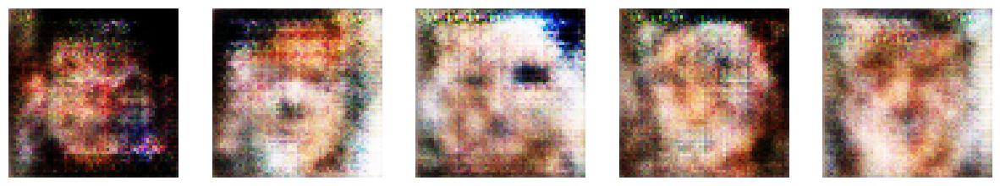

Epoch 82, Generator Loss: -0.2296, Critic Loss: -0.9820
Time for epoch 82 is 58.22126626968384 sec


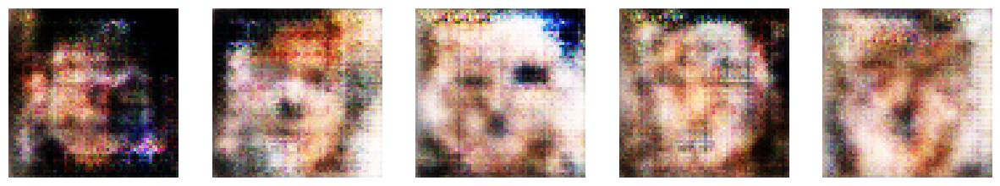

Epoch 83, Generator Loss: -0.5636, Critic Loss: -1.0802
Time for epoch 83 is 57.51328468322754 sec


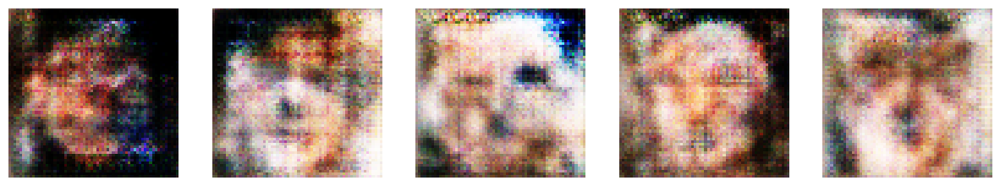

Epoch 84, Generator Loss: -0.2235, Critic Loss: -1.0158
Time for epoch 84 is 54.48691701889038 sec


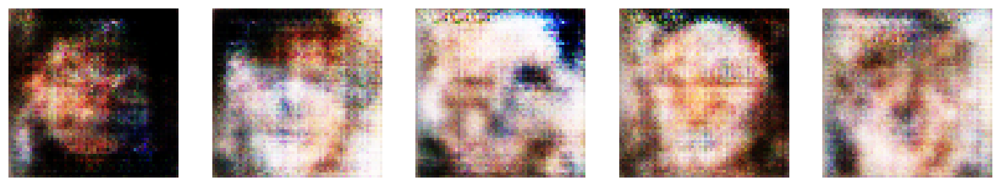

Epoch 85, Generator Loss: 0.1054, Critic Loss: -1.1013
Time for epoch 85 is 54.30811905860901 sec


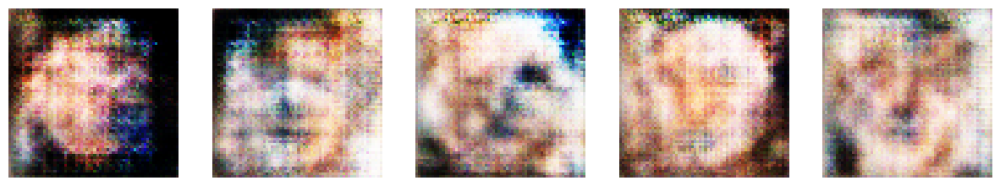

Epoch 86, Generator Loss: -0.0905, Critic Loss: -0.8699
Time for epoch 86 is 54.21452975273132 sec


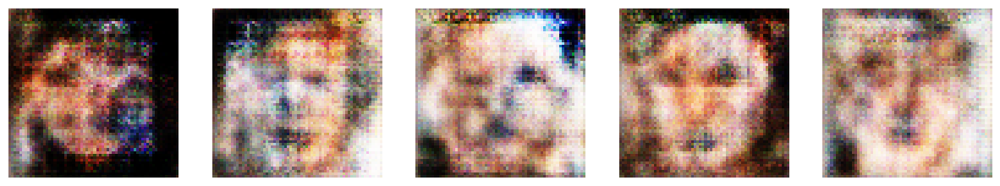

Epoch 87, Generator Loss: 0.0449, Critic Loss: -1.0281
Time for epoch 87 is 54.39198541641235 sec


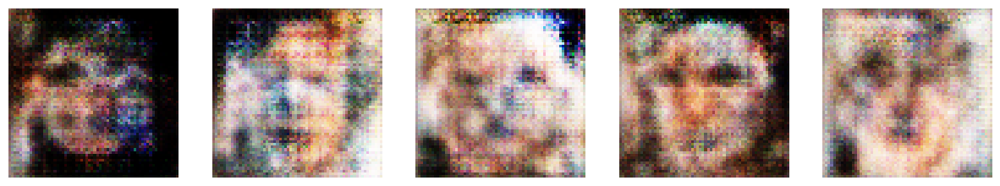

Epoch 88, Generator Loss: 0.0767, Critic Loss: -0.9930
Time for epoch 88 is 54.16712021827698 sec


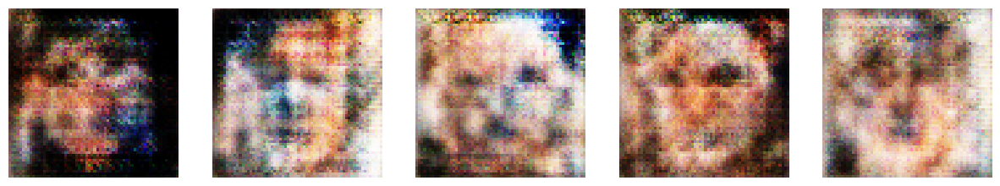

Epoch 89, Generator Loss: -0.2802, Critic Loss: -0.9746
Time for epoch 89 is 54.3291232585907 sec


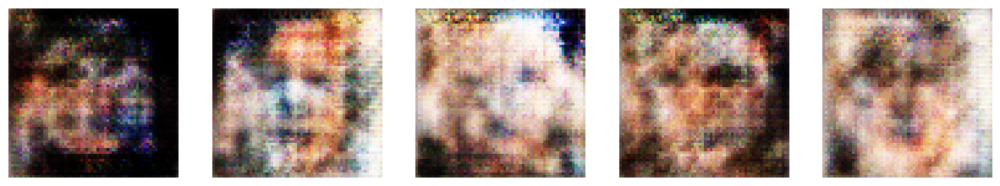

Epoch 90, Generator Loss: -0.4874, Critic Loss: -1.0297
Time for epoch 90 is 54.59796667098999 sec


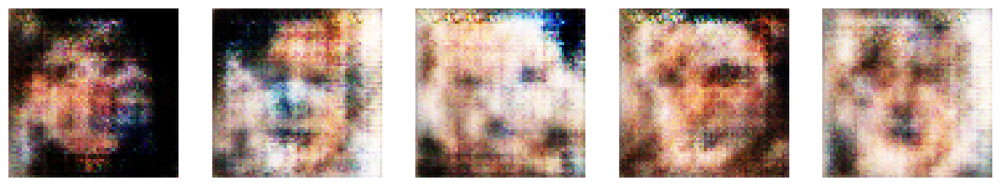

Epoch 91, Generator Loss: -0.6756, Critic Loss: -1.0729
Time for epoch 91 is 54.77899885177612 sec


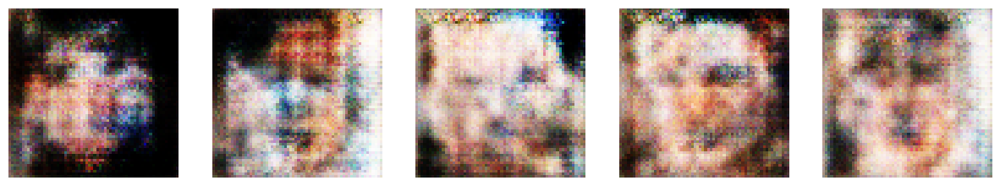

Epoch 92, Generator Loss: -0.0686, Critic Loss: -1.1363
Time for epoch 92 is 54.415618896484375 sec


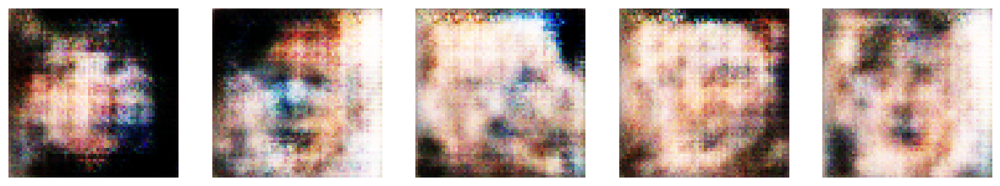

Epoch 93, Generator Loss: -0.9934, Critic Loss: -0.9802
Time for epoch 93 is 54.56566619873047 sec


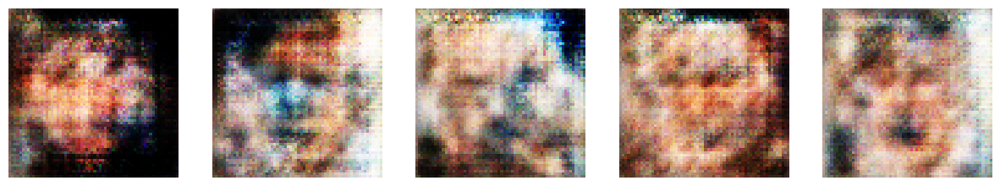

Epoch 94, Generator Loss: -0.3343, Critic Loss: -1.0619
Time for epoch 94 is 54.33405256271362 sec


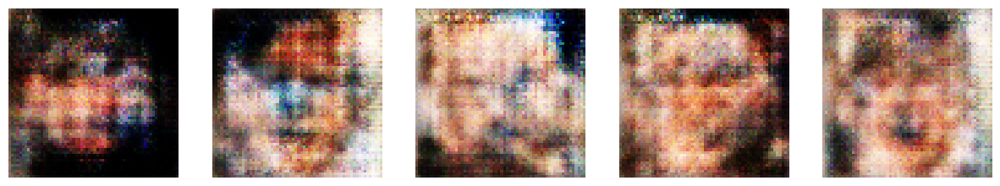

Epoch 95, Generator Loss: -0.8709, Critic Loss: -1.2861
Time for epoch 95 is 54.44577479362488 sec


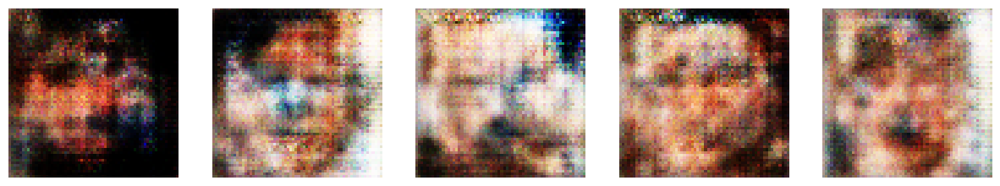

Epoch 96, Generator Loss: -0.3164, Critic Loss: -1.1649
Time for epoch 96 is 54.199713706970215 sec


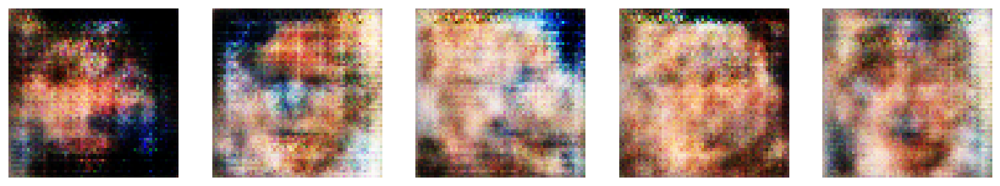

Epoch 97, Generator Loss: -0.6870, Critic Loss: -1.0123
Time for epoch 97 is 54.844839096069336 sec


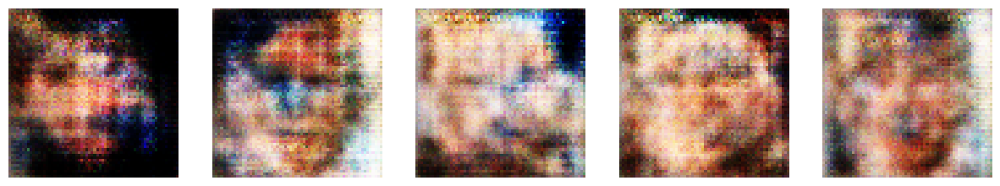

Epoch 98, Generator Loss: -1.2469, Critic Loss: -1.0639
Time for epoch 98 is 55.5050106048584 sec


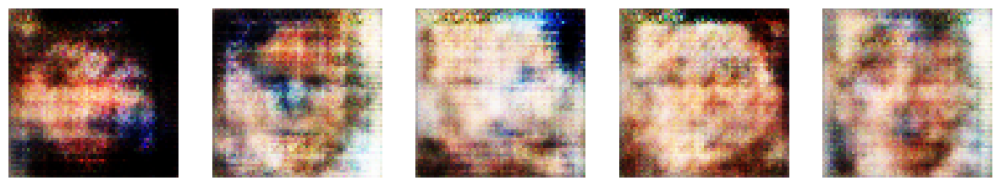

Epoch 99, Generator Loss: -0.9492, Critic Loss: -1.0876
Time for epoch 99 is 56.34592938423157 sec


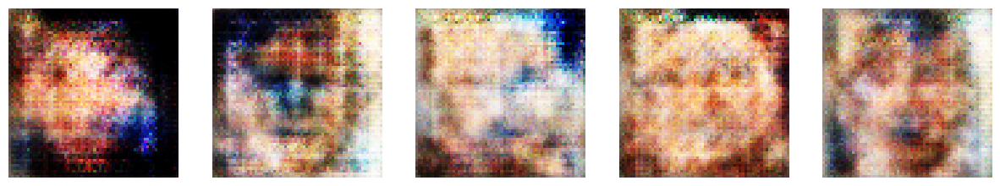

Epoch 100, Generator Loss: -0.4827, Critic Loss: -0.9620
Time for epoch 100 is 56.887059688568115 sec


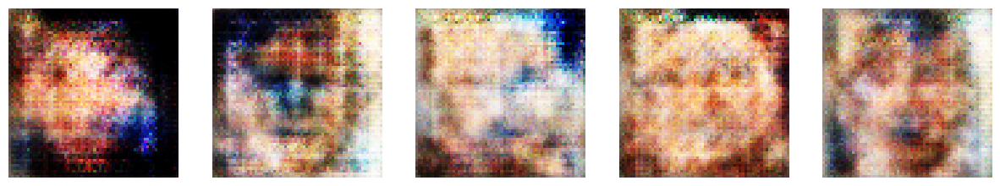

In [10]:
# Weight clipping for the critic
clip_value = 0.01

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, 100])

    # Train the critic more times than the generator
    for _ in range(5):
        with tf.GradientTape() as critic_tape:
            generated_images = generator(noise, training=True)

            real_output = critic(images, training=True)
            fake_output = critic(generated_images, training=True)

            critic_loss_value = critic_loss(real_output, fake_output)

        gradients_of_critic = critic_tape.gradient(critic_loss_value, critic.trainable_variables)
        critic_optimizer.apply_gradients(zip(gradients_of_critic, critic.trainable_variables))

        # Clip the weights of the critic
        for variable in critic.trainable_variables:
            variable.assign(tf.clip_by_value(variable, -clip_value, clip_value))

    # Train the generator
    with tf.GradientTape() as generator_tape:
        generated_images = generator(noise, training=True)
        fake_output = critic(generated_images, training=True)
        generator_loss_value = generator_loss(fake_output)

    gradients_of_generator = generator_tape.gradient(generator_loss_value, generator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))

    return generator_loss_value, critic_loss_value

def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig, axes = plt.subplots(1, NUM_EXAMPLES_TO_GENERATE, figsize=(15, 15))

    for i in range(predictions.shape[0]):
        axes[i].imshow((predictions[i] * 127.5 + 127.5).numpy().astype(np.uint8))
        axes[i].axis('off')

    plt.show()

def train(dataset, epochs):
    for epoch in range(epochs):
        start = time.time()

        gen_loss_epoch = 0
        critic_loss_epoch = 0
        num_batches = 0

        for image_batch in dataset:
            gen_loss, critic_loss = train_step(image_batch)
            gen_loss_epoch += gen_loss
            critic_loss_epoch += critic_loss
            num_batches += 1

        gen_loss_epoch /= num_batches
        critic_loss_epoch /= num_batches

        generate_and_save_images(generator, epoch + 1, seed)

        print(f'Epoch {epoch+1}, Generator Loss: {gen_loss_epoch:.4f}, Critic Loss: {critic_loss_epoch:.4f}')
        print('Time for epoch {} is {} sec'.format(epoch + 1, time.time() - start))

    generate_and_save_images(generator, epochs, seed)

# Set constants
EPOCHS = 100
NOISE_DIM = 100
NUM_EXAMPLES_TO_GENERATE = 5
BATCH_SIZE = 64

seed = tf.random.normal([NUM_EXAMPLES_TO_GENERATE, NOISE_DIM])

# Start training
train(dataset, EPOCHS)


### **Generated 5 Faces**

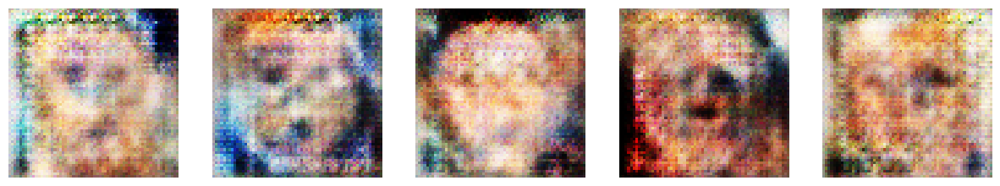

In [11]:
# Generate 5 faces
num_faces = 5
random_latent_vectors = tf.random.normal([num_faces, NOISE_DIM])
generated_faces = generator(random_latent_vectors, training=False)
generated_faces = (generated_faces * 127.5 + 127.5).numpy().astype(np.uint8)

# Display the generated faces
fig, axes = plt.subplots(1, num_faces, figsize=(15, 15))
for i in range(num_faces):
    axes[i].imshow(generated_faces[i])
    axes[i].axis('off')
plt.show()